In [ ]:
import numpy as np
from pop_pkpd_sim_data import *

def pk_model(t, y, KaA1, KeA1, KaA2, KeA2, k1, k2):
    A1a, A1b, A2a, A2b = y
    dA1a_dt = -KaA1 * A1a - k1 * A1a  
    dA2a_dt = -KaA2 * A2a + k1 * A1a  
    dA1b_dt = KaA1 * A1a - KeA1 * A1b - k2 * A1b
    dA2b_dt = KaA2 * A2a - KeA2 * A2b + k2 * A1b
    return [dA1a_dt, dA1b_dt, dA2a_dt, dA2b_dt]

num_individuals = 600

covariates = {
    'age': np.random.randint(20, 60, size=num_individuals),  
    'weight': np.random.normal(70, 10, size=num_individuals),  
}

params = {
    "KaA1": {
        'base': 0.1,
        'cov': {},
        'noice': 0.005
    },
    "KaA2": {
        'base': 0.1,
        'cov': {},
        'noice': 0.005
    },
    "KeA1": {
        'base': 0.1,
        'cov': {'age': {'cov_fn': power_cov, 'args': {'exp': -1.5, 'base':40}}, 'weight': {'cov_fn': power_cov, 'args': {'exp': -1.5, 'base':40}}},
        'noice': 0.005
    },
    "KeA2": {
        'base': 0.05,
        'cov': {'age': {'cov_fn': power_cov, 'args': {'exp': -1.4, 'base':40}}},
        'noice': 0.005
    },
    "k1": {
        'base': 0.05,
        'cov': {'age': {'cov_fn': power_cov, 'args': {'exp': 1.4, 'base':40}}},
        'noice': 0.005
    },
    'k2': {
        'base': 0.05,
        'cov': {'weight': {'cov_fn': power_cov, 'args': {'exp': 1.5, 'base':50}}},
        'noice': 0.005
    },
}

population_data = generate_population_parameters_with_covariates(n_individuals=num_individuals, base_dict=params, covariates_dict=covariates)

# Display results
print(population_data)


In [ ]:
transformed_data = transform_population_data(population_data)
print(transformed_data)

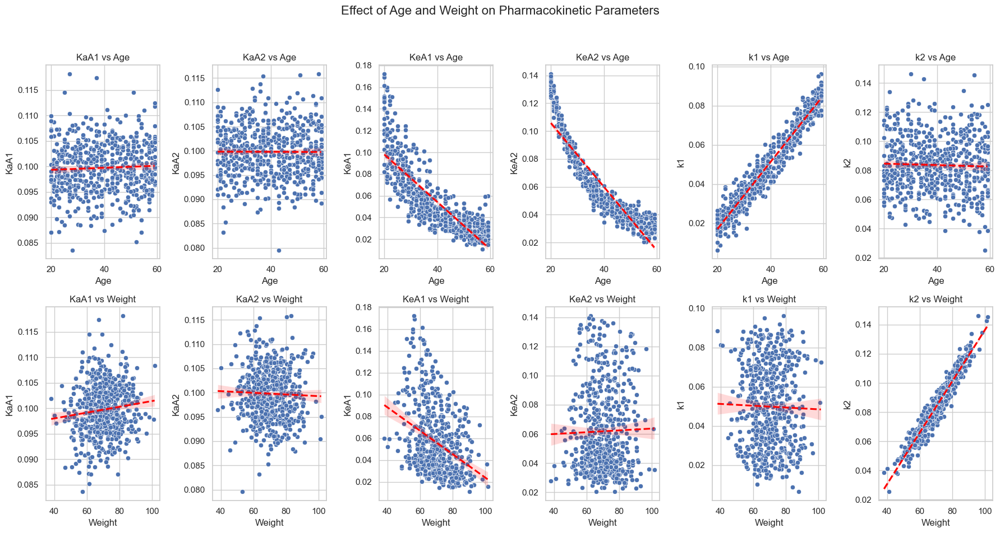

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set(style="whitegrid")

n_individuals = num_individuals
covariates = transformed_data['covariates']
population_params_with_covariates = transformed_data['params']
population_params = transformed_data['params']

fig, axes = plt.subplots(2,6, figsize=(18, 10))
fig.suptitle("Effect of Age and Weight on Pharmacokinetic Parameters", fontsize=16)

plot_param_vs_covariate(axes[0, 0], covariates['age'], population_params_with_covariates['KaA1'], 'Age', 'KaA1', 'KaA1 vs Age')
plot_param_vs_covariate(axes[0, 1], covariates['age'], population_params_with_covariates['KaA2'], 'Age', 'KaA2', 'KaA2 vs Age')
plot_param_vs_covariate(axes[0, 2], covariates['age'], population_params_with_covariates['KeA1'], 'Age', 'KeA1', 'KeA1 vs Age')
plot_param_vs_covariate(axes[0, 3], covariates['age'], population_params_with_covariates['KeA2'], 'Age', 'KeA2', 'KeA2 vs Age')
plot_param_vs_covariate(axes[0, 4], covariates['age'], population_params_with_covariates['k1'], 'Age', 'k1', 'k1 vs Age')
plot_param_vs_covariate(axes[0, 5], covariates['age'], population_params_with_covariates['k2'], 'Age', 'k2', 'k2 vs Age')

plot_param_vs_covariate(axes[1, 0], covariates['weight'], population_params_with_covariates['KaA1'], 'Weight', 'KaA1', 'KaA1 vs Weight')
plot_param_vs_covariate(axes[1, 1], covariates['weight'], population_params_with_covariates['KaA2'], 'Weight', 'KaA2','KaA2 vs Weight')
plot_param_vs_covariate(axes[1, 2], covariates['weight'], population_params_with_covariates['KeA1'], 'Weight', 'KeA1','KeA1 vs Weight')
plot_param_vs_covariate(axes[1, 3], covariates['weight'], population_params_with_covariates['KeA2'], 'Weight', 'KeA2','KeA2 vs Weight')
plot_param_vs_covariate(axes[1, 4], covariates['weight'], population_params_with_covariates['k1'], 'Weight', 'k1','k1 vs Weight')
plot_param_vs_covariate(axes[1, 5], covariates['weight'], population_params_with_covariates['k2'], 'Weight', 'k2','k2 vs Weight')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  
plt.show()


In [5]:
individuals = generate_individuals(num_individuals, population_params, dose_choices=[25,50,100,150,300], time_scale_choices=[48], time_scale_frequency=[1,3], num_doses=6)

all_results = pd.concat(
    [simulate_dosing_schedule(**individual) for individual in individuals],
    ignore_index=True
)

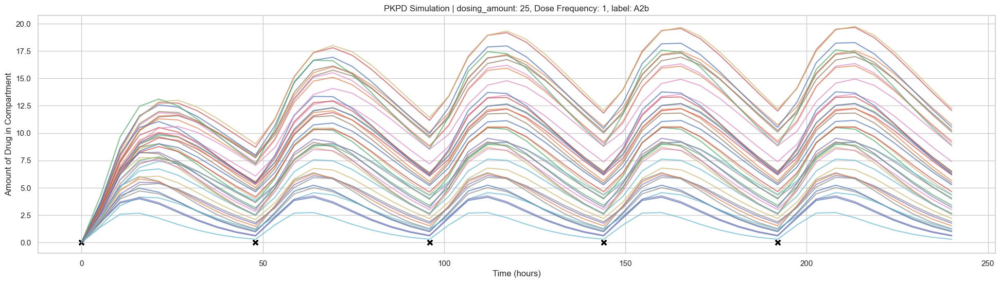

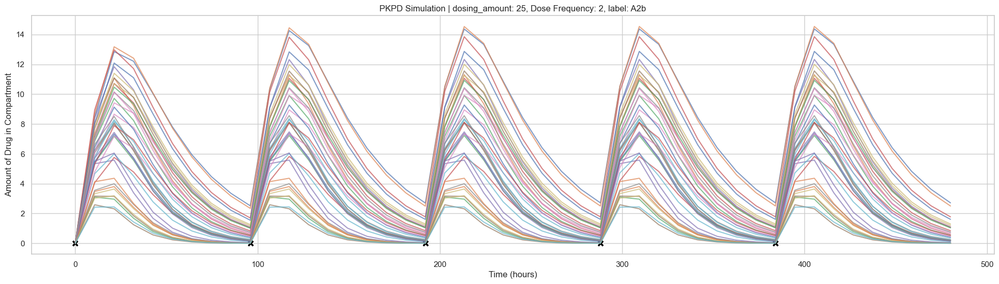

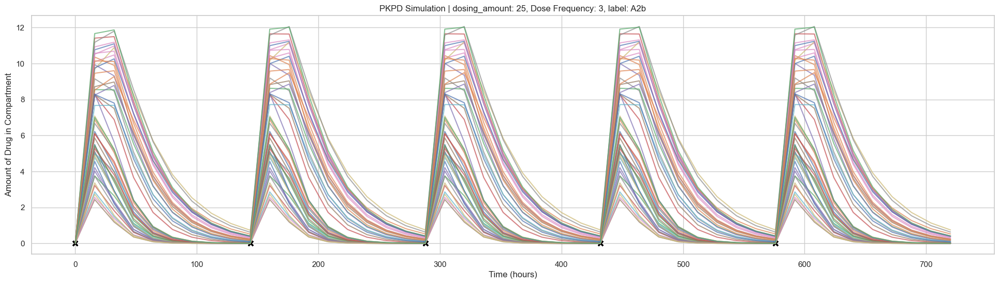

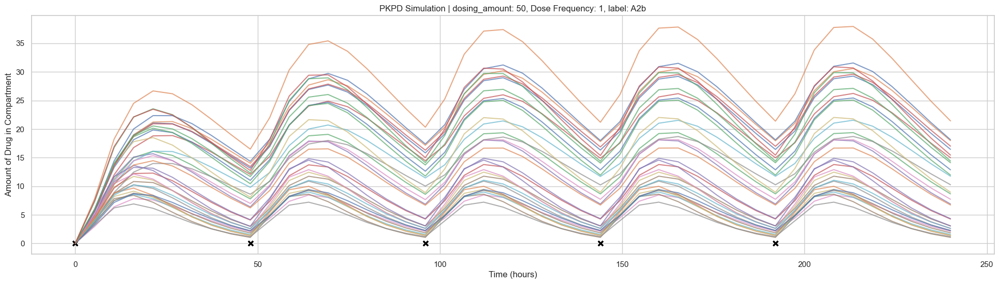

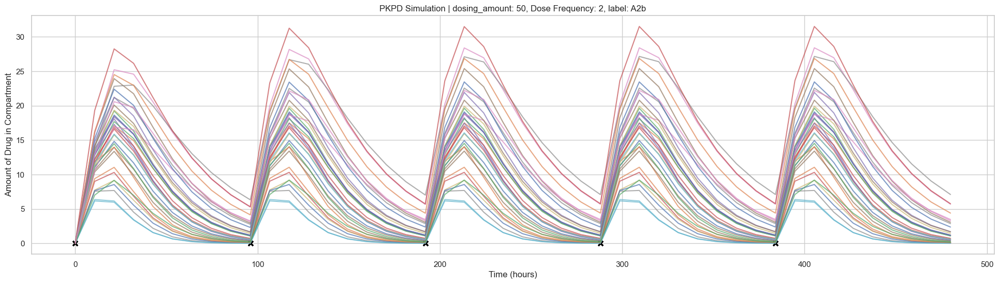

...

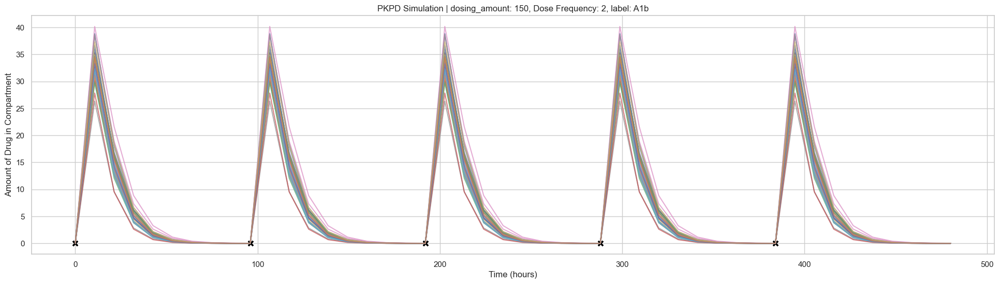

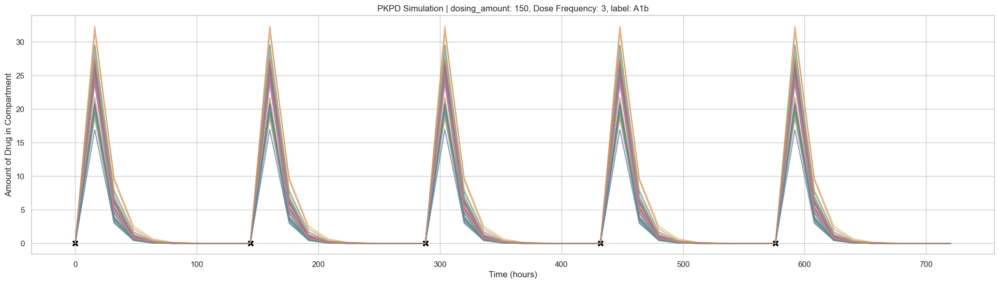

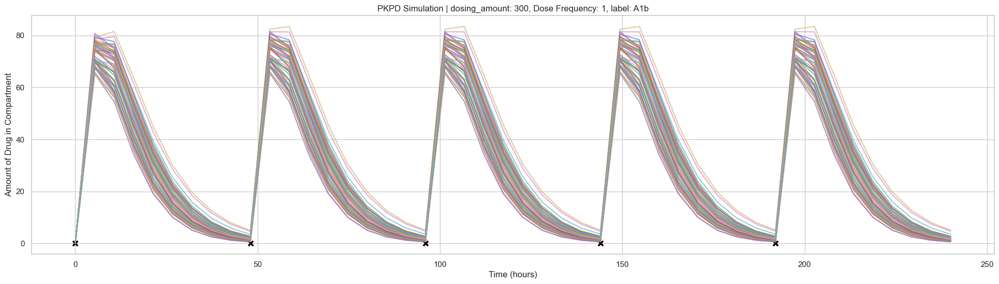

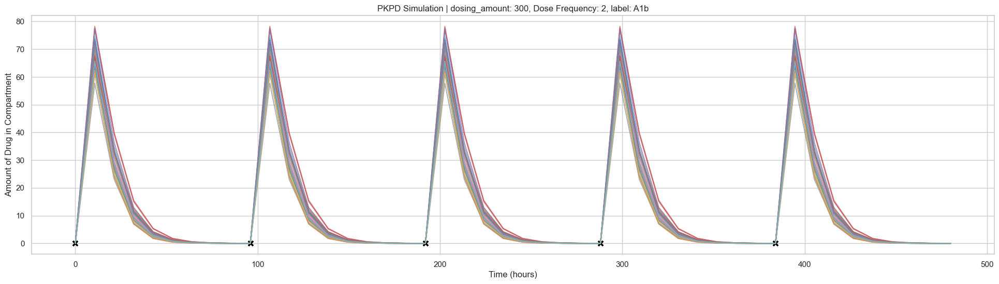

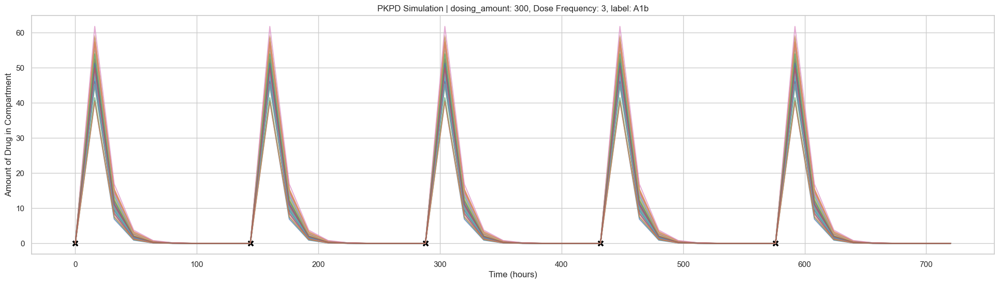

In [6]:
import matplotlib.pyplot as plt

def plot_pharmacokinetics_simulation(all_results, labels=['A2b', 'A1b']):
    """
    Plots pharmacokinetics simulation data for multiple individuals.
    A separate plot is generated for each unique combination of dosing cycle and dose frequency.
    
    Parameters:
    - all_results: DataFrame containing columns 'A1a', 'A1b', 'Dose', 'Dosing Cycle', 'Time', and 'Person ID'.
    - labels: List of compartments to plot (default ['A1a', 'A1b']).
    """
    for label in labels:
        for (dosing_cycle, dose_freq), group_data in all_results.groupby(['dosing_amount', 'DSFQ']):
            
            plt.figure(figsize=(24, 6))
            
            for person_id in group_data['Person ID'].unique():
                person_data = group_data[group_data['Person ID'] == person_id]
                plt.plot(person_data['Time'], person_data[label], label=f'Person {person_id} (Central Compartment)', alpha=0.7)
            
            plt.scatter(group_data['Time'][group_data['Dose'] > 0], 
                        [0] * sum(group_data['Dose'] > 0), color='black', marker='x', label='Dosing Times')
            
            plt.xlabel('Time (hours)')
            plt.ylabel('Amount of Drug in Compartment')
            plt.title(f'PKPD Simulation | dosing_amount: {dosing_cycle}, Dose Frequency: {dose_freq}, label: {label}')
            
            plt.grid(True)
            plt.show()

plot_pharmacokinetics_simulation(all_results)


In [7]:
all_results[all_results['Person ID'] == 3]

,Time,Time Since Last Dose,A1a,A1b,A2a,A2b,Dose,Dosing Cycle,DSFQ,Person ID,dosing_amount
100,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,100,1,2,3,100
101,10.666667,10.666667,19.500707,24.522047,12.619171,27.503605,0,1,2,3,100
102,21.333333,21.333333,3.803495,10.659676,6.459505,34.547360,0,1,2,3,100
103,32.000000,32.000000,0.742988,3.486714,2.526348,25.483333,0,1,2,3,100
104,42.666667,42.666667,0.144922,1.018089,0.894371,15.483375,0,1,2,3,100
105,53.333333,53.333333,0.028345,0.279685,0.301735,8.596508,0,1,2,3,100
106,64.000000,64.000000,0.005540,0.074036,0.099213,4.556892,0,1,2,3,100
107,74.666667,74.666667,0.001081,0.019111,0.032142,2.355877,0,1,2,3,100
108,85.333333,85.333333,0.000212,0.004853,0.010327,1.201145,0,1,2,3,100
109,96.000000,96.000000,0.000041,0.001217,0.003300,0.607600,0,1,2,3,100


In [8]:
all_results['study_id'] = 1000.0

In [9]:
#before and after dosing with same time value need to be handled
all_results = remove_duplicate_times(all_results, time_column="Time", group_column="Person ID")

In [10]:
all_results['Person ID'] = all_results['Person ID'] * 1.0
all_results['DSFQ'] = all_results['DSFQ'] * 1.0
all_results['DSFQ'] = all_results['DSFQ'] * 1.0
all_results['Dosing Cycle'] = all_results['Dosing Cycle'] * 1.0
all_results['Dose'] = all_results['Dose'] * 1.0
all_results['Time'] = all_results['Time'].round(1)
all_results['Time Since Last Dose'] = all_results['Time Since Last Dose'].round(1)
all_results['A1b'] = all_results['A1b'].round(3)
all_results['A2b'] = all_results['A2b'].round(3)

In [11]:
all_results

,Time,Time Since Last Dose,A1a,A1b,A2a,A2b,Dose,Dosing Cycle,DSFQ,Person ID,dosing_amount,study_id
0,0.0,0.0,300.000000,0.000,0.000000,0.000,300.0,1.0,3.0,1.0,300,1000.0
1,16.0,16.0,17.202416,40.572,43.448921,152.874,0.0,1.0,3.0,1.0,300,1000.0
2,32.0,32.0,0.988532,6.921,11.858796,163.232,0.0,1.0,3.0,1.0,300,1000.0
3,48.0,48.0,0.056809,0.918,2.700253,122.260,0.0,1.0,3.0,1.0,300,1000.0
4,64.0,64.0,0.003265,0.112,0.590495,84.846,0.0,1.0,3.0,1.0,300,1000.0
...,...,...,...,...,...,...,...,...,...,...,...,...
27595,656.0,80.0,0.006883,0.011,0.029730,0.305,0.0,5.0,3.0,600.0,100,1000.0
27596,672.0,96.0,0.001013,0.002,0.006433,0.074,0.0,5.0,3.0,600.0,100,1000.0
27597,688.0,112.0,0.000149,0.000,0.001363,0.017,0.0,5.0,3.0,600.0,100,1000.0
27598,704.0,128.0,0.000022,0.000,0.000285,0.004,0.0,5.0,3.0,600.0,100,1000.0


In [12]:
transformed_all_results = pd.DataFrame({
    'PTNM': all_results['Person ID'],              
    'STUD': all_results['study_id'],               
    'DSFQ': all_results['DSFQ'],                   
    'CYCL': all_results['Dosing Cycle'],           
    'AMT': all_results['Dose'],                    
    'TIME': all_results['Time'],                   
    'TFDS': all_results['Time Since Last Dose'],   
    'DV1': all_results['A1b'],                     
    'DV2': all_results['A2b'],                     
})

transformed_all_results.columns = ['PTNM', 'STUD', 'DSFQ', 'CYCL', 'AMT', 'TIME', 'TFDS', 'DV1', 'DV2']

transformed_all_results.to_csv('sim_data.csv')

In [ ]:
"""
| Column name   | Description                                                   |
| ------------- | -------------                                                 |
| PTNM          | patient number                                                |
| STUD          | study number                                                  |
| DSFQ          | dosing frequency                                              |
| CYCL          | dosing cycles                                                 |
| AMT           | dosing amounts                                                |
| TIME          | time in hours since the experiment begin for one individual   |
| TFDS          | time in hours since the last dosing                           |
| DV            | the observations of PK                                        |
"""

"""
covariates = ['SEX','AGE','WT','RACR','RACE','BSA',
                'BMI','ALBU','TPRO','WBC','CRCL','CRET',
                'SGOT','SGPT','TBIL','TMBD','ALKP', 'HER', 
                'ECOG','KEOALL','ASIAN']
"""

In [13]:
cov_df = pd.DataFrame(transformed_data['covariates'])
cov_df['PTNM'] = cov_df.index +1
cov_df['weight'] = cov_df['weight'].round(1)

In [14]:
transformed_all_results = pd.merge(transformed_all_results, cov_df, on='PTNM')

transformed_all_results.to_csv('sim_data.csv')